In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip "/content/drive/MyDrive/plant.zip" -d "/content/plant_data"

Streaming output truncated to the last 5000 lines.
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (415).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (416).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (417).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (418).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (419).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (42).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (420).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (421).jpg  
  inflating: /content/plant_data/plant/Images/Plant Species/Solanum lycopersicum/Tomato (422).jpg  
  inflating: /content/plant_data/plant/Images/Plan

In [3]:
import os
import shutil
import hashlib
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Rescaling, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.layers import (GlobalAveragePooling2D, Dense, Dropout,
                                     BatchNormalization)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras import Sequential as KSequential
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast, RandomTranslation, RandomBrightness
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.regularizers import l2
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import cv2
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications import EfficientNetV2L



In [33]:

# Configuration

MAIN_DATA_DIR = '/content/plant_data/plant'
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS_TOP = 25       # Stage 1: train top layers only
EPOCHS_FINE = 15      # Stage 2: fine-tune backbone
CONFIDENCE_THRESHOLD = 0.7
AUTOTUNE = tf.data.AUTOTUNE

In [5]:


# Data Cleaning Functions

def find_and_remove_corrupted_images(directory):
    if not os.path.exists(directory):
        print(f"Directory not found: {directory}")
        return

    print(f"Checking for corrupted images in: {directory}")
    corrupted_count = 0
    total_count = 0

    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                total_count += 1
                file_path = os.path.join(root, file)
                try:
                    with Image.open(file_path) as img:
                        img.verify()
                except (IOError, SyntaxError):
                    print(f"Deleting corrupted image: {file_path}")
                    os.remove(file_path)
                    corrupted_count += 1

    print(f"Removed {corrupted_count} corrupted images out of {total_count}")


def remove_duplicate_images(directory):
    print(f"Removing duplicates in: {directory}")
    hashes = {}
    duplicate_count = 0

    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                file_path = os.path.join(root, file)
                with open(file_path, "rb") as f:
                    file_hash = hashlib.md5(f.read()).hexdigest()
                if file_hash in hashes:
                    os.remove(file_path)
                    duplicate_count += 1
                else:
                    hashes[file_hash] = file_path

    print(f"Removed {duplicate_count} duplicate images")


# Clean datasets
for subdir in ["//content/plant_data/plant/Images/Edibility", "/content/plant_data/plant/Images/Plant Species", "/content/plant_data/plant/Images/Plant Organ Type", "/content/plant_data/plant/Images/Plant Health", "/content/plant_data/plant/Images/Edibility"]:
    full_dir = os.path.join(MAIN_DATA_DIR, subdir)
    find_and_remove_corrupted_images(full_dir)
    remove_duplicate_images(full_dir)

Checking for corrupted images in: //content/plant_data/plant/Images/Edibility
Removed 0 corrupted images out of 18194
Removing duplicates in: //content/plant_data/plant/Images/Edibility
Removed 0 duplicate images
Checking for corrupted images in: /content/plant_data/plant/Images/Plant Species
Removed 0 corrupted images out of 18194
Removing duplicates in: /content/plant_data/plant/Images/Plant Species
Removed 0 duplicate images
Checking for corrupted images in: /content/plant_data/plant/Images/Plant Organ Type
Removed 0 corrupted images out of 18194
Removing duplicates in: /content/plant_data/plant/Images/Plant Organ Type
Removed 0 duplicate images
Checking for corrupted images in: /content/plant_data/plant/Images/Plant Health
Removed 0 corrupted images out of 18194
Removing duplicates in: /content/plant_data/plant/Images/Plant Health
Removed 0 duplicate images
Checking for corrupted images in: /content/plant_data/plant/Images/Edibility
Removed 0 corrupted images out of 18194
Removing 


--- Loading Plant Name Dataset ---
Found 18194 files belonging to 26 classes.
Using 14556 files for training.
Found 18194 files belonging to 26 classes.
Using 3638 files for validation.
Plant Name Classes: ['Alovera', 'Apple', 'Begonia', 'Calla_lily', 'Daisy', 'Dendelion', 'Dhalia', 'Grape', 'Iris', 'Jasmine', 'Lavender', 'Lotus', 'Mango', 'Merigold', 'Orcid', 'Poppy', 'Potato', 'Respberry', 'Rose', 'Snack_plant', 'Spider_plant', 'Strawberry', 'Sunflower', 'Tomato', 'Tulip', 'Tulsi']

--- Loading Plant Species Dataset ---
Found 18194 files belonging to 26 classes.
Using 14556 files for training.
Found 18194 files belonging to 26 classes.
Using 3638 files for validation.
Plant Species Classes: ['Aloe barbadensis miller', 'Begonia spp', 'Bellis perennis', 'Chlorophytum comosum', 'Dahlia pinnata', 'Dracaena trifasciata', 'Fragaria × ananassa', 'Helianthus annuus', 'Iris germanica', 'Jasminum sambac', 'Lavandula angustifolia', 'Malus domestica', 'Mangifera indica', 'Nelumbo nucifera', 'Oc

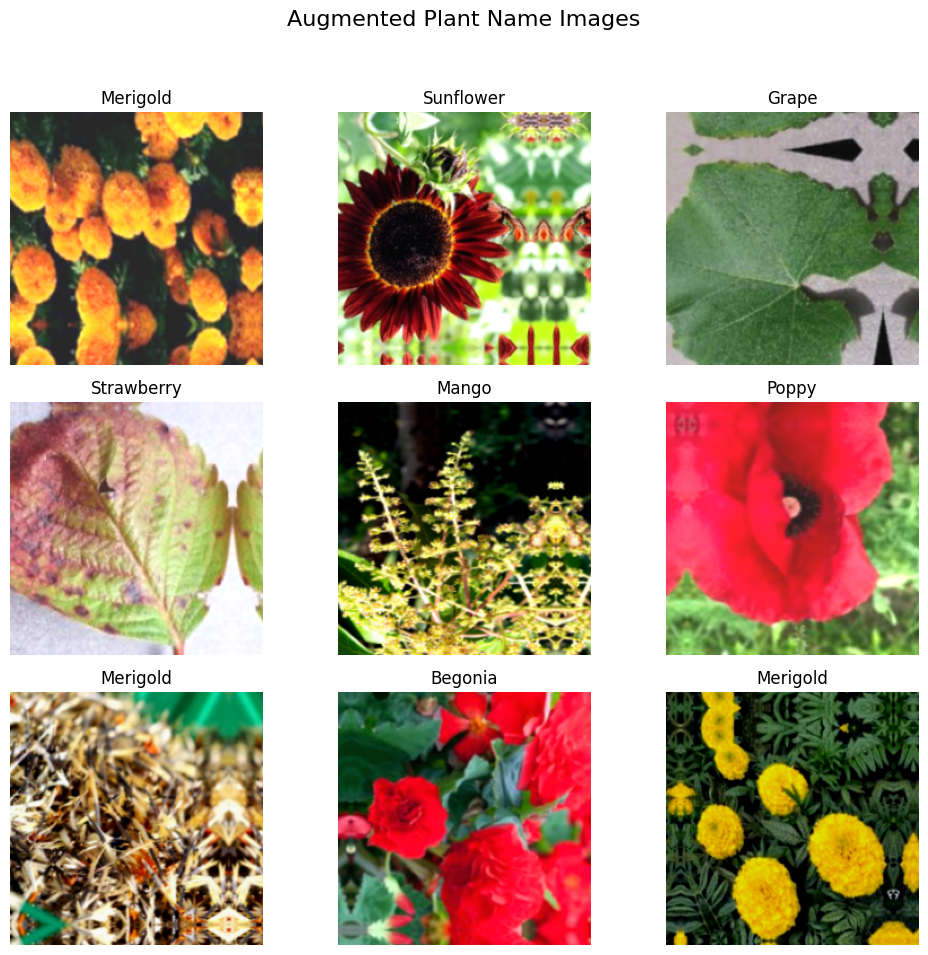

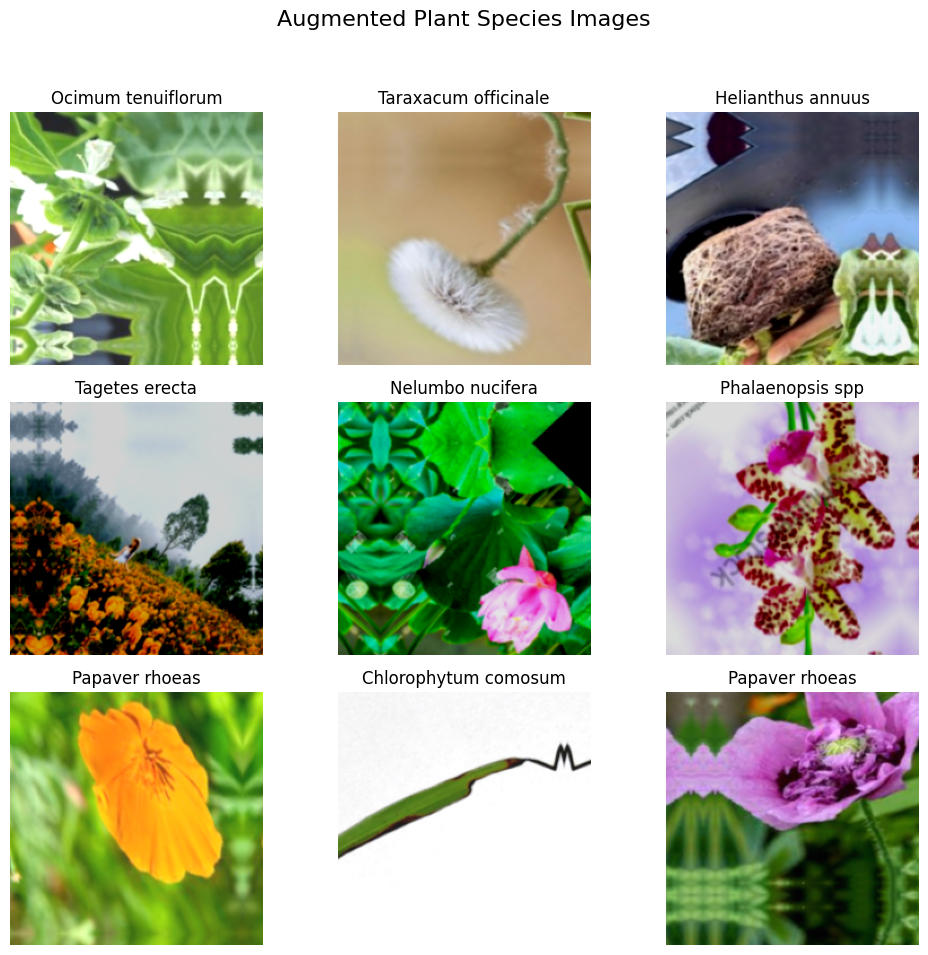

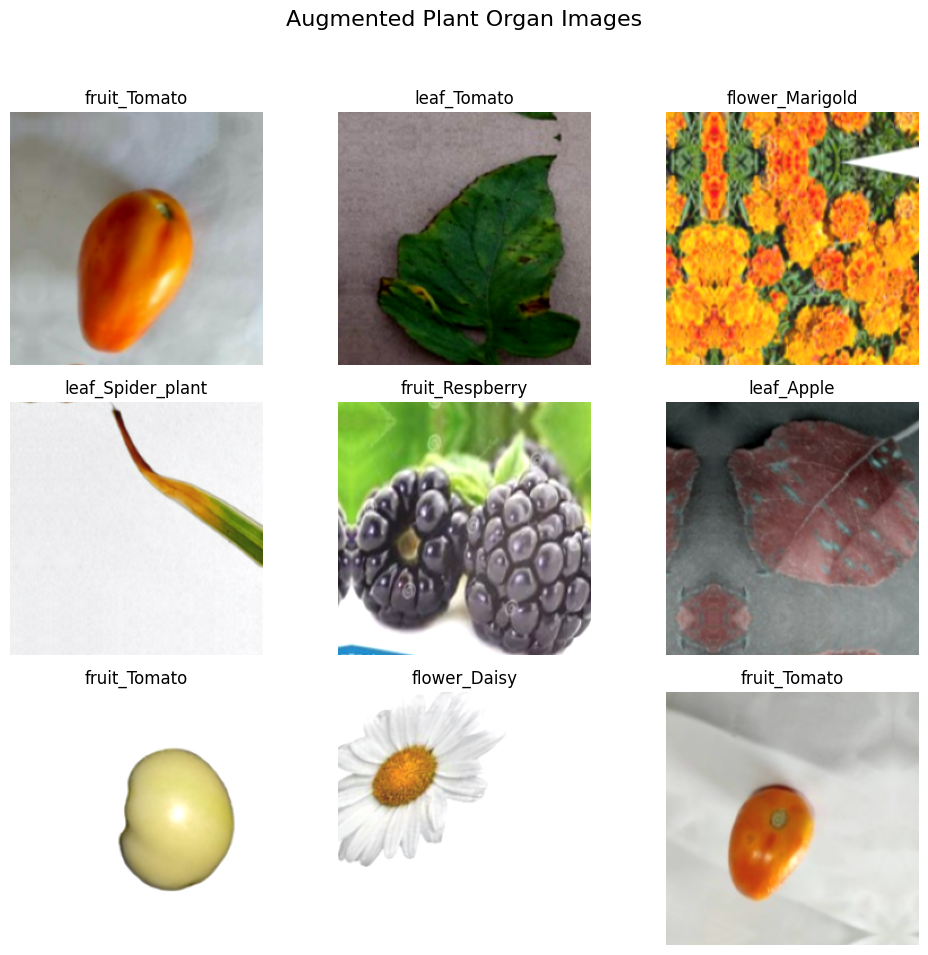

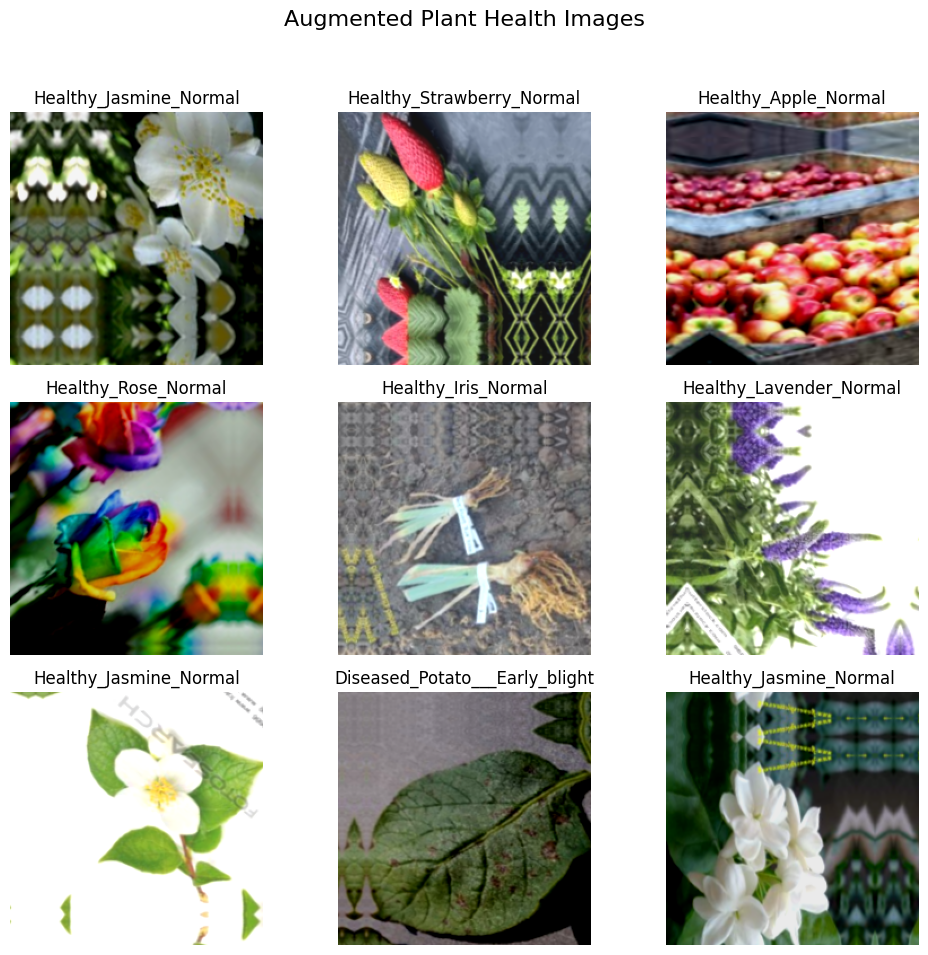

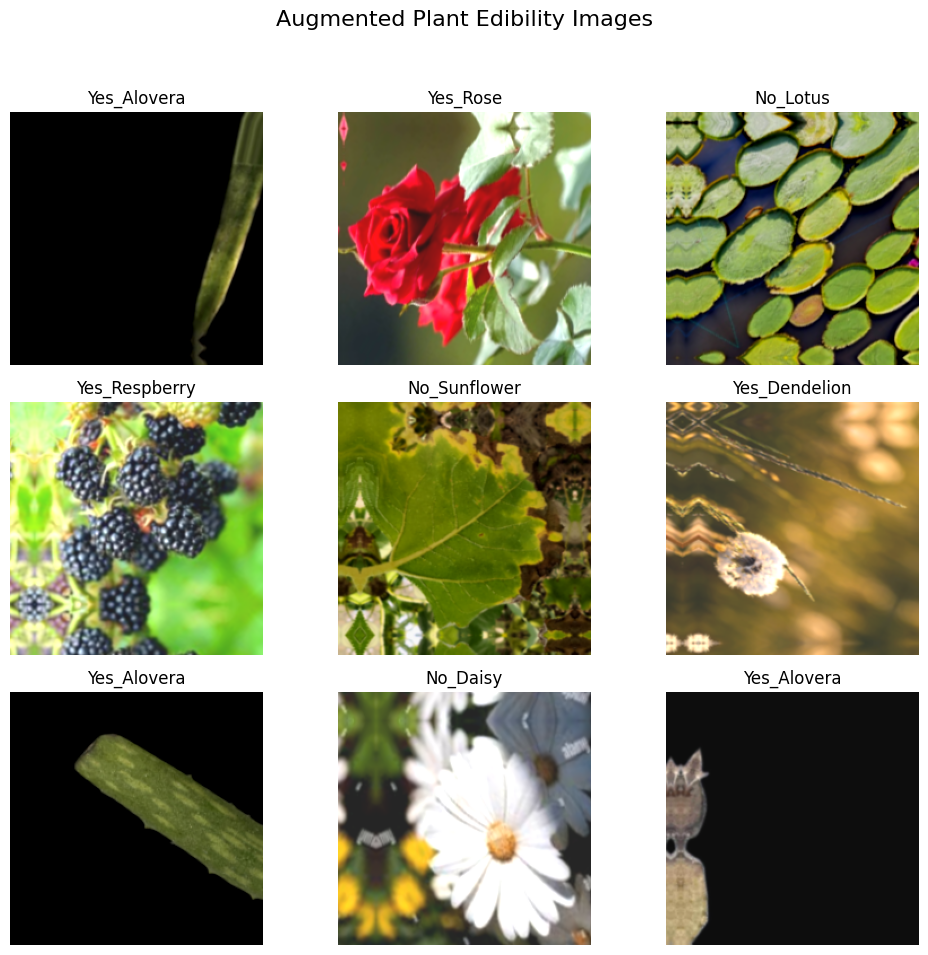

In [6]:

# --- Data Augmentation Layer ---
data_augmentation = KSequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomContrast(0.3),
    RandomTranslation(height_factor=0.2, width_factor=0.2),
    RandomBrightness(0.2)
])

# --- Utility function for visualization ---
def visualize_dataset(dataset, class_names, title):
    plt.figure(figsize=(10,10))
    for images, labels in dataset.take(1):
        for i in range(9):
            ax = plt.subplot(3,3,i+1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(f"{class_names[labels[i]]}")
            plt.axis("off")
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0,0.03,1,0.95])
    plt.show()

# ==============================
# --- Plant Name Dataset ---
# ==============================
print("\n--- Loading Plant Name Dataset ---")
train_plant_name_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Name"),
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_name_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Name"),
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_names = train_plant_name_ds.class_names
print(f"Plant Name Classes: {plant_names}")

train_plant_name_ds = train_plant_name_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_name_ds = val_plant_name_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Species Dataset ---
# ==============================
print("\n--- Loading Plant Species Dataset ---")
train_plant_species_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Species"),
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_species_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Species"),
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_species = train_plant_species_ds.class_names
print(f"Plant Species Classes: {plant_species}")

train_plant_species_ds = train_plant_species_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_species_ds = val_plant_species_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Organ Dataset ---
# ==============================
print("\n--- Loading Plant Organ Dataset ---")
plant_organ_tmp_dir = 'tmp_plant_organ_dataset'
if os.path.exists(plant_organ_tmp_dir):
    shutil.rmtree(plant_organ_tmp_dir)
os.makedirs(plant_organ_tmp_dir)

for organ in os.listdir(os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Organ Type")):
    organ_path = os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Organ Type", organ)
    if os.path.isdir(organ_path):
        for plant in os.listdir(organ_path):
            plant_path = os.path.join(organ_path, plant)
            if os.path.isdir(plant_path):
                new_class_name = f"{organ}_{plant}"
                new_class_path = os.path.join(plant_organ_tmp_dir, new_class_name)
                os.makedirs(new_class_path, exist_ok=True)
                for img_file in os.listdir(plant_path):
                    src = os.path.join(plant_path, img_file)
                    dst = os.path.join(new_class_path, img_file)
                    shutil.copy(src, dst)

train_plant_organ_ds = tf.keras.utils.image_dataset_from_directory(
    plant_organ_tmp_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_organ_ds = tf.keras.utils.image_dataset_from_directory(
    plant_organ_tmp_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_organs = train_plant_organ_ds.class_names
print(f"Plant Organ Classes: {plant_organs}")

train_plant_organ_ds = train_plant_organ_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_organ_ds = val_plant_organ_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Health Dataset ---
# ==============================
print("\n--- Loading Plant Health Dataset ---")
plant_health_tmp_dir = 'tmp_plant_health_dataset'
if os.path.exists(plant_health_tmp_dir):
    shutil.rmtree(plant_health_tmp_dir)
os.makedirs(plant_health_tmp_dir)

for health in os.listdir(os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Health")):
    health_path = os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Plant Health", health)
    if os.path.isdir(health_path):
        for plant in os.listdir(health_path):
            plant_path = os.path.join(health_path, plant)
            if os.path.isdir(plant_path):
                new_class_name = f"{health}_{plant}"
                new_class_path = os.path.join(plant_health_tmp_dir, new_class_name)
                os.makedirs(new_class_path, exist_ok=True)
                for img_file in os.listdir(plant_path):
                    src = os.path.join(plant_path, img_file)
                    dst = os.path.join(new_class_path, img_file)
                    shutil.copy(src, dst)

train_plant_health_ds = tf.keras.utils.image_dataset_from_directory(
    plant_health_tmp_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_health_ds = tf.keras.utils.image_dataset_from_directory(
    plant_health_tmp_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_health = train_plant_health_ds.class_names
print(f"Plant Health Classes: {plant_health}")

train_plant_health_ds = train_plant_health_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_health_ds = val_plant_health_ds.prefetch(buffer_size=AUTOTUNE)

# ==============================
# --- Plant Edibility Dataset ---
# ==============================
print("\n--- Loading Plant Edibility Dataset ---")
plant_edibility_tmp_dir = 'tmp_plant_edibility_dataset'
if os.path.exists(plant_edibility_tmp_dir):
    shutil.rmtree(plant_edibility_tmp_dir)
os.makedirs(plant_edibility_tmp_dir)

for edibility in os.listdir(os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Edibility")):
    edibility_path = os.path.join(MAIN_DATA_DIR,"/content/plant_data/plant/Images/Edibility", edibility)
    if os.path.isdir(edibility_path):
        for plant in os.listdir(edibility_path):
            plant_path = os.path.join(edibility_path, plant)
            if os.path.isdir(plant_path):
                new_class_name = f"{edibility}_{plant}"
                new_class_path = os.path.join(plant_edibility_tmp_dir, new_class_name)
                os.makedirs(new_class_path, exist_ok=True)
                for img_file in os.listdir(plant_path):
                    src = os.path.join(plant_path, img_file)
                    dst = os.path.join(new_class_path, img_file)
                    shutil.copy(src, dst)

train_plant_edibility_ds = tf.keras.utils.image_dataset_from_directory(
    plant_edibility_tmp_dir,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
val_plant_edibility_ds = tf.keras.utils.image_dataset_from_directory(
    plant_edibility_tmp_dir,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)
plant_edibility = train_plant_edibility_ds.class_names
print(f"Plant Edibility Classes: {plant_edibility}")

train_plant_edibility_ds = train_plant_edibility_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
).prefetch(buffer_size=AUTOTUNE)
val_plant_edibility_ds = val_plant_edibility_ds.prefetch(buffer_size=AUTOTUNE)



# ==============================
# --- Visualizations for all
# ==============================
visualize_dataset(train_plant_name_ds, plant_names, "Augmented Plant Name Images")
visualize_dataset(train_plant_species_ds, plant_species, "Augmented Plant Species Images")
visualize_dataset(train_plant_organ_ds, plant_organs, "Augmented Plant Organ Images")
visualize_dataset(train_plant_health_ds, plant_health, "Augmented Plant Health Images")
visualize_dataset(train_plant_edibility_ds, plant_edibility, "Augmented Plant Edibility Images")



In [7]:
# --- Model Builder ---
def build_model(num_classes, img_size=224):
    base_model = EfficientNetV2L(
        weights="imagenet",
        include_top=False,
        input_shape=(img_size, img_size, 3)
    )
    base_model.trainable = True

    x = base_model.output
    x = GlobalAveragePooling2D()(x)

    x = Dense(1024, activation="swish", kernel_regularizer=l2(1e-4))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)

    x = Dense(512, activation="swish", kernel_regularizer=l2(1e-4))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    outputs = Dense(num_classes, activation="softmax")(x)

    model = Model(inputs=base_model.input, outputs=outputs)
    model.compile(
        optimizer=Adam(learning_rate=3e-5),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=["accuracy"]
    )
    return model


# -----------------------------
# --- Callbacks ---
# -----------------------------
def get_callbacks(model_name):
    return [
        EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, verbose=1),
        ModelCheckpoint(f'{model_name}.keras', monitor='val_accuracy', save_best_only=True, verbose=1)
    ]

# -----------------------------
# --- Generic Training Function ---
# -----------------------------
def train_model(train_ds, val_ds, class_names, model_name, img_size=IMG_SIZE):
    print(f"\n=== Training {model_name} Model ===")
    model = build_model(len(class_names), img_size)
    model.summary()

    # Prefetch datasets once
    train_ds_prefetch = train_ds.prefetch(AUTOTUNE)
    val_ds_prefetch = val_ds.prefetch(AUTOTUNE)

    # Stage 1: Train top layers only
    print("\n--- Stage 1: Training top layers only ---")
    history_stage1 = model.fit(
        train_ds_prefetch,
        validation_data=val_ds_prefetch,
        epochs=EPOCHS_TOP,
        callbacks=get_callbacks(f"{model_name}_stage1"),
        verbose=1
    )

    # Stage 2: Fine-tune top 30 layers of backbone
    print("\n--- Stage 2: Fine-tuning top backbone layers ---")
    for layer in model.layers[-30:]:
        if not isinstance(layer, tf.keras.layers.BatchNormalization):
            layer.trainable = True

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    history_stage2 = model.fit(
        train_ds_prefetch,
        validation_data=val_ds_prefetch,
        epochs=EPOCHS_FINE,
        callbacks=get_callbacks(f"{model_name}_stage2"),
        verbose=1
    )

    return model, (history_stage1, history_stage2)

# -----------------------------
# --- Train All Datasets ---
# -----------------------------
datasets = [
    (train_plant_name_ds, val_plant_name_ds, plant_names, "Plant_Name"),
    (train_plant_species_ds, val_plant_species_ds, plant_species, "Plant_Species"),
    (train_plant_organ_ds, val_plant_organ_ds, plant_organs, "Plant_Organ"),
    (train_plant_health_ds, val_plant_health_ds, plant_health, "Plant_Health"),
    (train_plant_edibility_ds, val_plant_edibility_ds, plant_edibility, "Plant_Edibility"),
]

trained_models = {}

for train_ds, val_ds, classes, name in datasets:
    model, history = train_model(train_ds, val_ds, classes, name, IMG_SIZE)
    trained_models[name] = {"model": model, "history": history}

print("\n All datasets trained successfully")



=== Training Plant_Name Model ===
473176280/473176280 ━━━━━━━━━━━━━━━━━━━━ 12s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ rescaling[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      9,216 │ stem_activation[… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │        128 │ block1a_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 112, 112,  │          0 │ block1a_project_… │
│                     │ 32)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 112, 112,  │      9,216 │ block1a_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 112, 112,  │        128 │ block1b_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 112, 112,  │          0 │ block1b_drop[0][… │
│                     │ 32)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 112, 112,  │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 112, 112,  │        128 │ block1c_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 112, 112,  │          0 │ block1c_project_

 Total params: 119,602,874 (456.25 MB)

 Trainable params: 119,087,226 (454.28 MB)

 Non-trainable params: 515,648 (1.97 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - accuracy: 0.1869 - loss: 3.6544
Epoch 1: val_accuracy improved from -inf to 0.72925, saving model to Plant_Name_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 721s 804ms/step - accuracy: 0.1873 - loss: 3.6524 - val_accuracy: 0.7292 - val_loss: 1.2362 - learning_rate: 3.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step - accuracy: 0.6863 - loss: 1.3369
Epoch 2: val_accuracy improved from 0.72925 to 0.85212, saving model to Plant_Name_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 105s 229ms/step - accuracy: 0.6864 - loss: 1.3366 - val_accuracy: 0.8521 - val_loss: 0.6946 - learning_rate: 3.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step - accuracy: 0.7999 - loss: 0.8833
Epoch 3: val_accuracy improved from 0.85212 to 0.89582, saving model to Plant_Name_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 106s 230ms/step - accuracy: 0.7999 - loss: 0.8831 - val_accuracy: 0.8958 - val_lo

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ input_layer_2[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ rescaling_1[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      9,216 │ stem_activation[… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │        128 │ block1a_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 112, 112,  │          0 │ block1a_project_… │
│                     │ 32)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 112, 112,  │      9,216 │ block1a_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 112, 112,  │        128 │ block1b_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 112, 112,  │          0 │ block1b_drop[0][… │
│                     │ 32)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 112, 112,  │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 112, 112,  │        128 │ block1c_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 112, 112,  │          0 │ block1c_project_

 Total params: 119,602,874 (456.25 MB)

 Trainable params: 119,087,226 (454.28 MB)

 Non-trainable params: 515,648 (1.97 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 872ms/step - accuracy: 0.1821 - loss: 3.6775
Epoch 1: val_accuracy improved from -inf to 0.76251, saving model to Plant_Species_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 756s 979ms/step - accuracy: 0.1825 - loss: 3.6755 - val_accuracy: 0.7625 - val_loss: 1.1993 - learning_rate: 3.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - accuracy: 0.6802 - loss: 1.3616
Epoch 2: val_accuracy improved from 0.76251 to 0.86668, saving model to Plant_Species_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 109s 236ms/step - accuracy: 0.6802 - loss: 1.3612 - val_accuracy: 0.8667 - val_loss: 0.6481 - learning_rate: 3.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - accuracy: 0.7941 - loss: 0.9152
Epoch 3: val_accuracy improved from 0.86668 to 0.90929, saving model to Plant_Species_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 113s 245ms/step - accuracy: 0.7942 - loss: 0.9150 - val_accuracy: 0.9093

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 224, 224,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ rescaling_2[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      9,216 │ stem_activation[… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │        128 │ block1a_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 112, 112,  │          0 │ block1a_project_… │
│                     │ 32)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 112, 112,  │      9,216 │ block1a_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 112, 112,  │        128 │ block1b_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 112, 112,  │          0 │ block1b_drop[0][… │
│                     │ 32)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 112, 112,  │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 112, 112,  │        128 │ block1c_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 112, 112,  │          0 │ block1c_project_

 Total params: 119,639,810 (456.39 MB)

 Trainable params: 119,124,162 (454.42 MB)

 Non-trainable params: 515,648 (1.97 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - accuracy: 0.1608 - loss: 4.6169
Epoch 1: val_accuracy improved from -inf to 0.73337, saving model to Plant_Organ_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 626s 679ms/step - accuracy: 0.1612 - loss: 4.6143 - val_accuracy: 0.7334 - val_loss: 1.7593 - learning_rate: 3.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - accuracy: 0.6929 - loss: 1.5435
Epoch 2: val_accuracy improved from 0.73337 to 0.84882, saving model to Plant_Organ_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 112s 243ms/step - accuracy: 0.6929 - loss: 1.5432 - val_accuracy: 0.8488 - val_loss: 0.7911 - learning_rate: 3.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.8110 - loss: 0.9586
Epoch 3: val_accuracy improved from 0.84882 to 0.89362, saving model to Plant_Organ_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 111s 242ms/step - accuracy: 0.8110 - loss: 0.9585 - val_accuracy: 0.8936 - val

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 224, 224,  │          0 │ input_layer_4[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ rescaling_3[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      9,216 │ stem_activation[… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │        128 │ block1a_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 112, 112,  │          0 │ block1a_project_… │
│                     │ 32)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 112, 112,  │      9,216 │ block1a_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 112, 112,  │        128 │ block1b_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 112, 112,  │          0 │ block1b_drop[0][… │
│                     │ 32)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 112, 112,  │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 112, 112,  │        128 │ block1c_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 112, 112,  │          0 │ block1c_project_

 Total params: 119,625,959 (456.34 MB)

 Trainable params: 119,110,311 (454.37 MB)

 Non-trainable params: 515,648 (1.97 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 557ms/step - accuracy: 0.1128 - loss: 4.7082
Epoch 1: val_accuracy improved from -inf to 0.61270, saving model to Plant_Health_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 634s 689ms/step - accuracy: 0.1131 - loss: 4.7062 - val_accuracy: 0.6127 - val_loss: 2.0502 - learning_rate: 3.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.5518 - loss: 2.0092
Epoch 2: val_accuracy improved from 0.61270 to 0.78725, saving model to Plant_Health_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 113s 245ms/step - accuracy: 0.5519 - loss: 2.0087 - val_accuracy: 0.7872 - val_loss: 0.9993 - learning_rate: 3.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - accuracy: 0.7188 - loss: 1.2516
Epoch 3: val_accuracy improved from 0.78725 to 0.86614, saving model to Plant_Health_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 112s 243ms/step - accuracy: 0.7188 - loss: 1.2514 - val_accuracy: 0.8661 - 

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_4         │ (None, 224, 224,  │          0 │ input_layer_5[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ rescaling_4[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      9,216 │ stem_activation[… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │        128 │ block1a_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 112, 112,  │          0 │ block1a_project_… │
│                     │ 32)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 112, 112,  │      9,216 │ block1a_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 112, 112,  │        128 │ block1b_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 112, 112,  │          0 │ block1b_drop[0][… │
│                     │ 32)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 112, 112,  │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 112, 112,  │        128 │ block1c_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 112, 112,  │          0 │ block1c_project_

 Total params: 119,610,569 (456.28 MB)

 Trainable params: 119,094,921 (454.31 MB)

 Non-trainable params: 515,648 (1.97 MB)


--- Stage 1: Training top layers only ---
Epoch 1/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 574ms/step - accuracy: 0.1739 - loss: 3.9982
Epoch 1: val_accuracy improved from -inf to 0.75893, saving model to Plant_Edibility_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 634s 690ms/step - accuracy: 0.1743 - loss: 3.9960 - val_accuracy: 0.7589 - val_loss: 1.2798 - learning_rate: 3.0000e-05
Epoch 2/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.6808 - loss: 1.4238
Epoch 2: val_accuracy improved from 0.75893 to 0.87576, saving model to Plant_Edibility_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 113s 246ms/step - accuracy: 0.6809 - loss: 1.4235 - val_accuracy: 0.8758 - val_loss: 0.6539 - learning_rate: 3.0000e-05
Epoch 3/25
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.8064 - loss: 0.8972
Epoch 3: val_accuracy improved from 0.87576 to 0.91836, saving model to Plant_Edibility_stage1.keras
455/455 ━━━━━━━━━━━━━━━━━━━━ 115s 251ms/step - accuracy: 0.8064 - loss: 0.8971 - val_accuracy: 

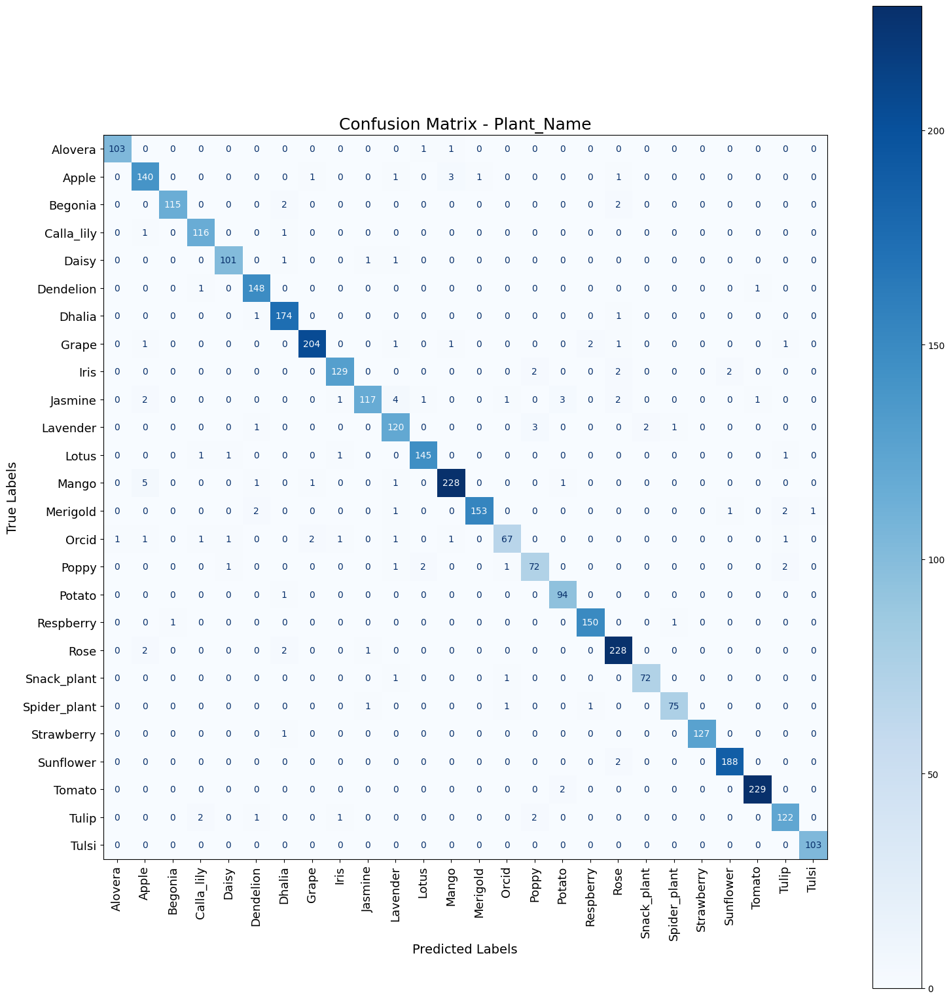


--- Classification Report: Plant_Name ---
              precision    recall  f1-score   support

     Alovera       0.99      0.98      0.99       105
       Apple       0.92      0.95      0.94       147
     Begonia       0.99      0.97      0.98       119
  Calla_lily       0.96      0.98      0.97       118
       Daisy       0.97      0.97      0.97       104
   Dendelion       0.96      0.99      0.97       150
      Dhalia       0.96      0.99      0.97       176
       Grape       0.98      0.97      0.97       211
        Iris       0.97      0.96      0.96       135
     Jasmine       0.97      0.89      0.93       132
    Lavender       0.91      0.94      0.93       127
       Lotus       0.97      0.97      0.97       149
       Mango       0.97      0.96      0.97       237
    Merigold       0.99      0.96      0.97       160
       Orcid       0.94      0.87      0.91        77
       Poppy       0.91      0.91      0.91        79
      Potato       0.94      0.99     

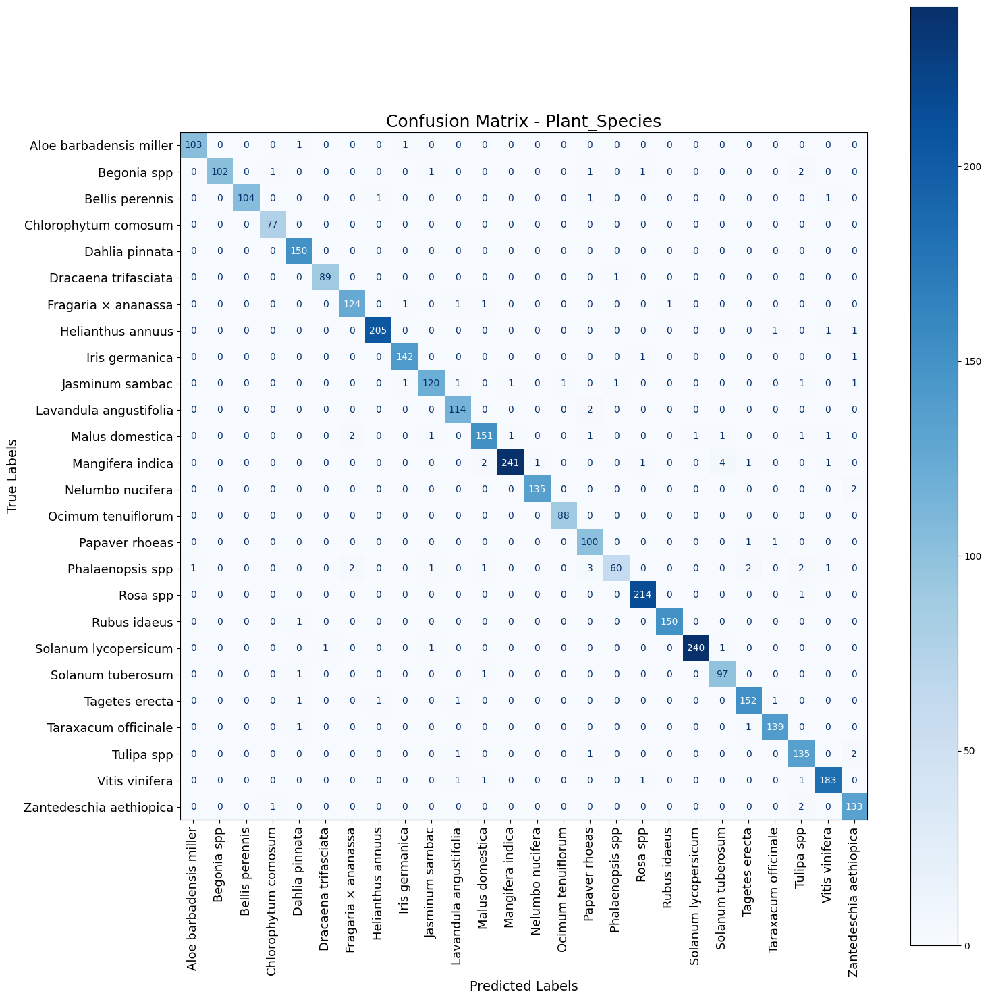


--- Classification Report: Plant_Species ---
                         precision    recall  f1-score   support

Aloe barbadensis miller       0.99      0.98      0.99       105
            Begonia spp       1.00      0.94      0.97       108
        Bellis perennis       1.00      0.97      0.99       107
   Chlorophytum comosum       0.97      1.00      0.99        77
         Dahlia pinnata       0.97      1.00      0.98       150
   Dracaena trifasciata       0.99      0.99      0.99        90
    Fragaria × ananassa       0.97      0.97      0.97       128
      Helianthus annuus       0.99      0.99      0.99       208
         Iris germanica       0.98      0.99      0.98       144
        Jasminum sambac       0.97      0.94      0.96       127
 Lavandula angustifolia       0.96      0.98      0.97       116
        Malus domestica       0.96      0.94      0.95       160
       Mangifera indica       0.99      0.96      0.98       251
       Nelumbo nucifera       0.99      0.9

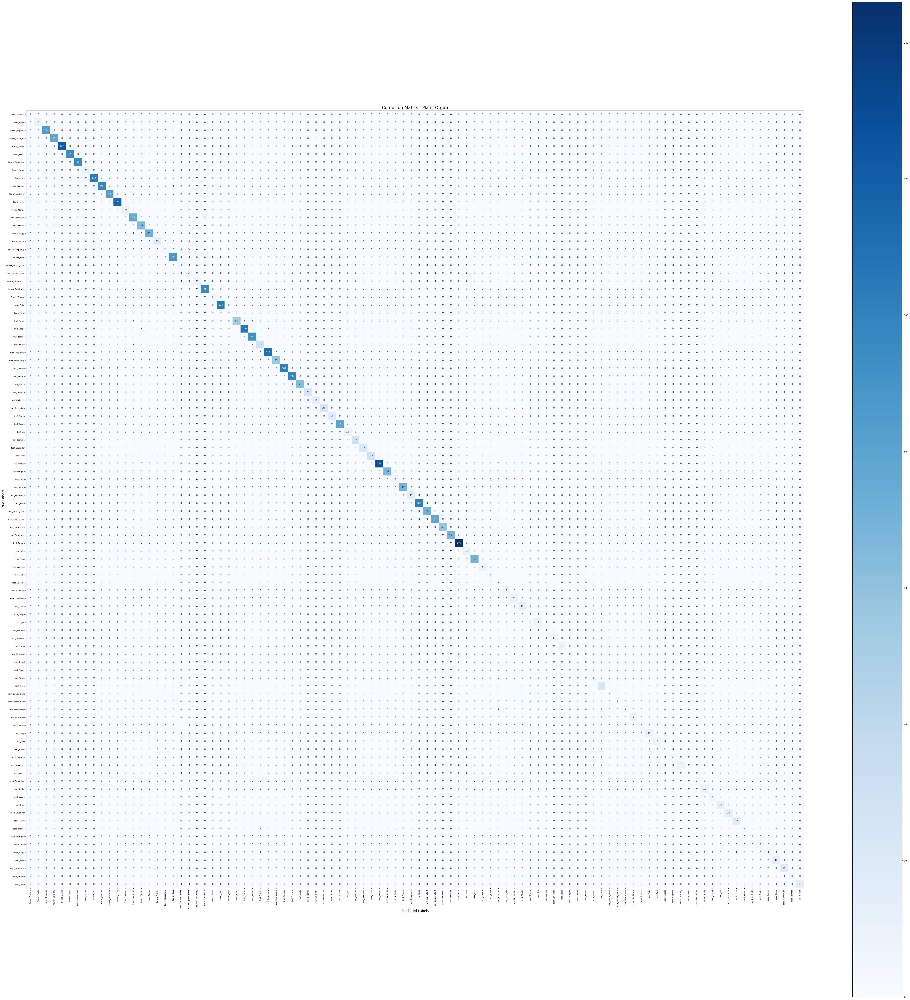


--- Classification Report: Plant_Organ ---
                     precision    recall  f1-score   support

     flower_Alovera       1.00      1.00      1.00         1
       flower_Apple       1.00      1.00      1.00         9
     flower_Begonia       0.98      0.98      0.98        86
  flower_Calla_lily       0.96      0.97      0.97        80
      flower_Dahlia       1.00      1.00      1.00       122
       flower_Daisy       1.00      0.97      0.98        98
   flower_Dendelion       0.96      1.00      0.98        96
       flower_Grape       1.00      1.00      1.00         9
        flower_Iris       0.99      1.00      1.00       103
     flower_Jasmine       0.94      0.95      0.95       103
    flower_Lavender       1.00      1.00      1.00        83
       flower_Lotus       1.00      1.00      1.00       115
       flower_Mango       0.77      1.00      0.87        10
    flower_Marigold       0.93      0.96      0.94        78
      flower_Orchid       0.96      0.92

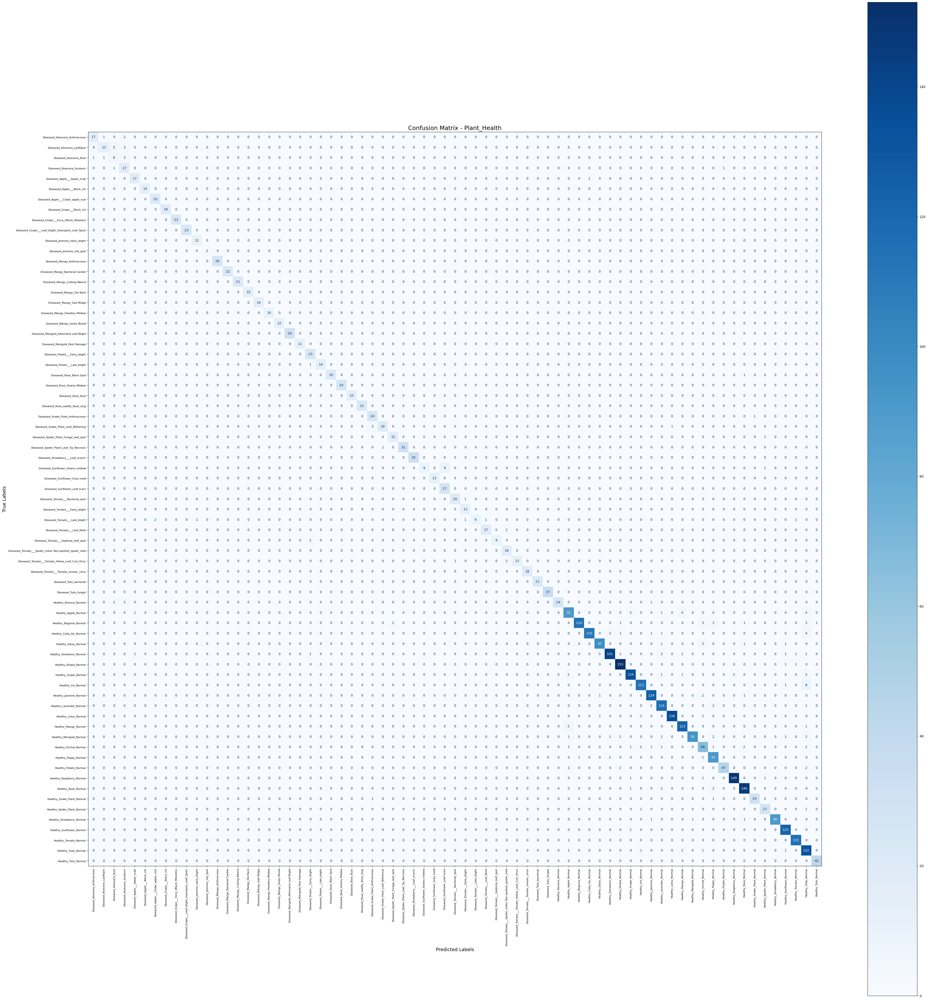


--- Classification Report: Plant_Health ---
                                                        precision    recall  f1-score   support

                         Diseased_Aloevera_Anthracnose       0.77      0.85      0.81        20
                            Diseased_Aloevera_LeafSpot       0.87      0.52      0.65        25
                                Diseased_Aloevera_Rust       0.43      0.55      0.48        11
                             Diseased_Aloevera_Sunburn       0.61      0.89      0.72        19
                           Diseased_Apple___Apple_scab       0.89      0.94      0.92        18
                            Diseased_Apple___Black_rot       1.00      1.00      1.00        14
                     Diseased_Apple___Cedar_apple_rust       0.91      1.00      0.95        20
                            Diseased_Grape___Black_rot       1.00      1.00      1.00        18
                 Diseased_Grape___Esca_(Black_Measles)       1.00      1.00      1.00     

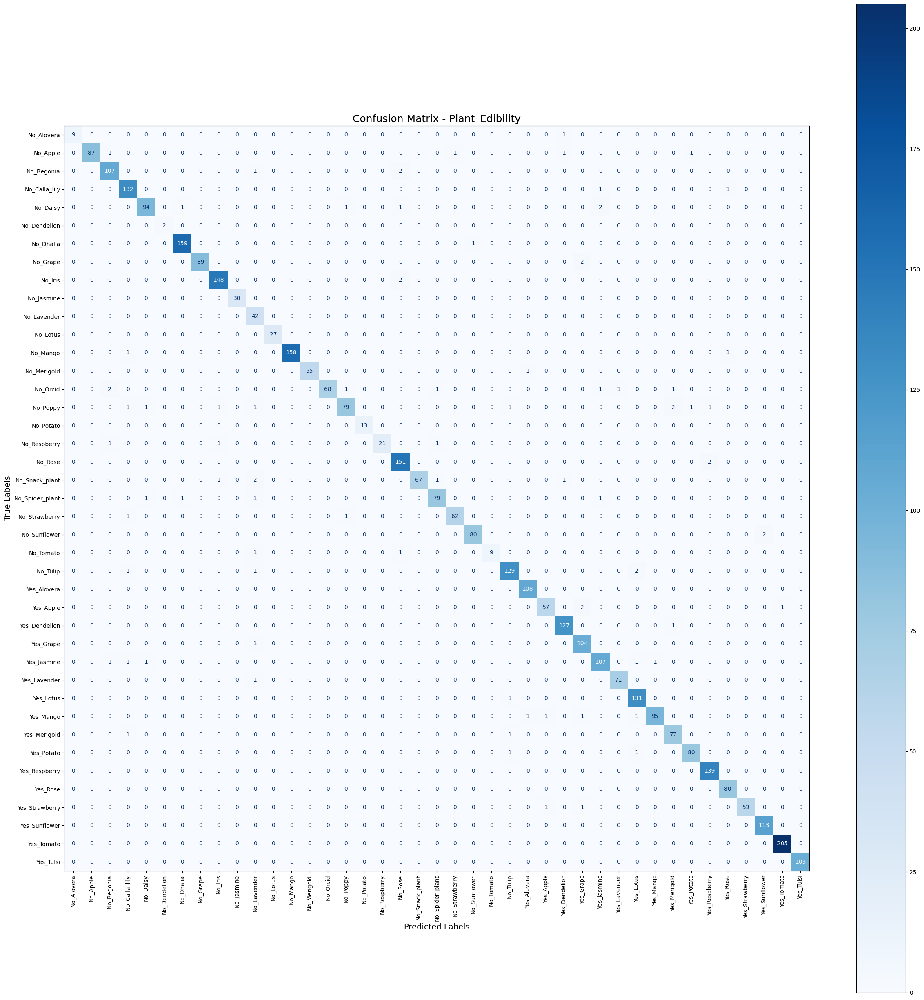


--- Classification Report: Plant_Edibility ---
                 precision    recall  f1-score   support

     No_Alovera       1.00      0.90      0.95        10
       No_Apple       1.00      0.96      0.98        91
     No_Begonia       0.96      0.97      0.96       110
  No_Calla_lily       0.96      0.99      0.97       134
       No_Daisy       0.97      0.95      0.96        99
   No_Dendelion       1.00      1.00      1.00         2
      No_Dhalia       0.99      0.99      0.99       160
       No_Grape       1.00      0.98      0.99        91
        No_Iris       0.98      0.99      0.98       150
     No_Jasmine       1.00      1.00      1.00        30
    No_Lavender       0.82      1.00      0.90        42
       No_Lotus       1.00      1.00      1.00        27
       No_Mango       1.00      0.99      0.99       160
    No_Merigold       1.00      0.98      0.99        56
       No_Orcid       1.00      0.91      0.95        75
       No_Poppy       0.96      0.90   

In [38]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import numpy as np

def evaluate_model(model, val_ds, class_names, title):
    val_images, val_labels = [], []

    # Collect all images and labels
    for x, y in val_ds:
        val_images.append(x.numpy())
        val_labels.append(y.numpy())
    val_images = np.concatenate(val_images)
    val_labels = np.concatenate(val_labels)

    # Predictions
    pred_labels = np.argmax(model.predict(val_images, verbose=0), axis=1)

    # Confusion matrix
    all_labels = np.arange(len(class_names))
    cm = confusion_matrix(val_labels, pred_labels, labels=all_labels)

    # ---- Adjust figure size and font based on number of classes ----
    num_classes = len(class_names)
    figsize = max(12, num_classes * 0.6)  # scale figure more aggressively for many classes
    plt.figure(figsize=(figsize, figsize))

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(
        cmap=plt.cm.Blues,
        ax=plt.gca(),
        xticks_rotation=90,
        values_format='d',
        colorbar=True
    )

    # Font scaling
    font_size = max(8, 18 - num_classes // 5)  # decrease font slightly for large number of classes
    plt.title(f'Confusion Matrix - {title}', fontsize=18)
    plt.xticks(fontsize=font_size, rotation=90)
    plt.yticks(fontsize=font_size)

    plt.xlabel("Predicted Labels", fontsize=14)
    plt.ylabel("True Labels", fontsize=14)

    plt.tight_layout()
    plt.show()

    # ---- Classification Report ----
    print(f"\n--- Classification Report: {title} ---")
    print(classification_report(
        val_labels,
        pred_labels,
        labels=all_labels,
        target_names=class_names,
        zero_division=0
    ))


# ===============================
# Evaluate ALL 5 Models Together
# ===============================
evaluation_datasets = {
    "Plant_Name": (val_plant_name_ds, plant_names),
    "Plant_Species": (val_plant_species_ds, plant_species),
    "Plant_Organ": (val_plant_organ_ds, plant_organs),
    "Plant_Health": (val_plant_health_ds, plant_health),
    "Plant_Edibility": (val_plant_edibility_ds, plant_edibility),
}

for model_name, (val_ds, class_names) in evaluation_datasets.items():
    model = trained_models[model_name]["model"]
    evaluate_model(model, val_ds, class_names, model_name)


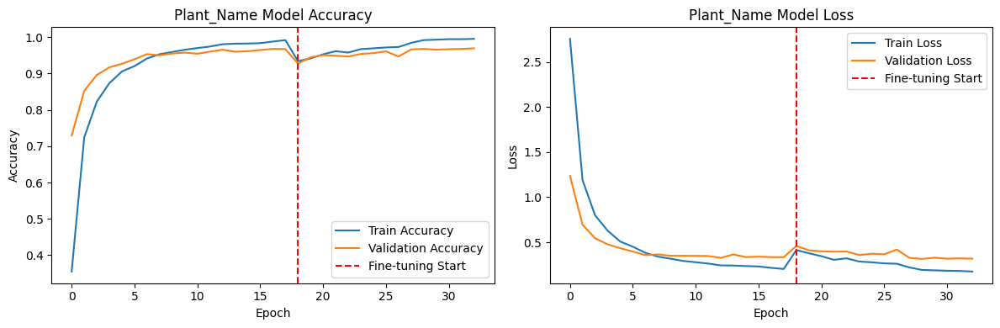

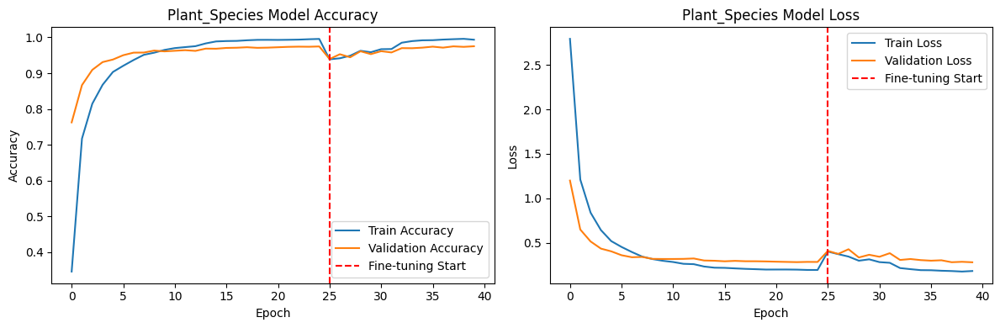

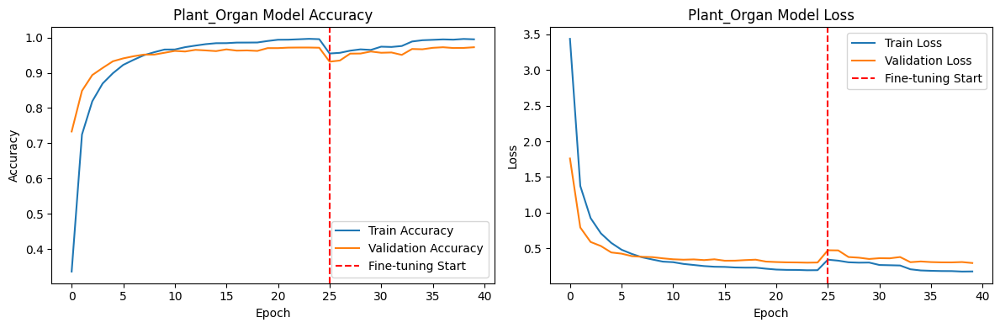

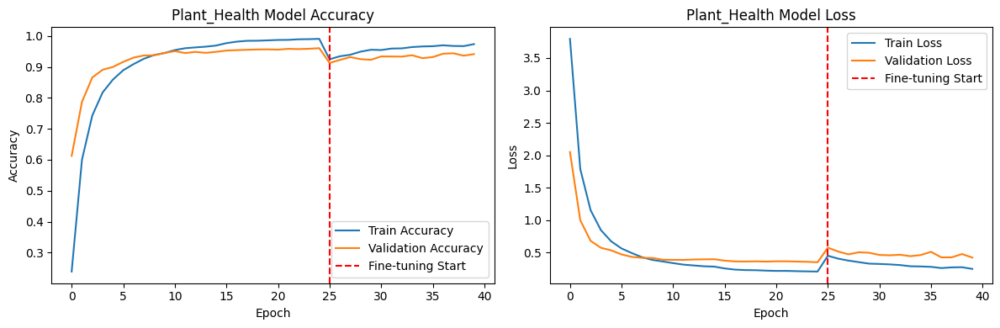

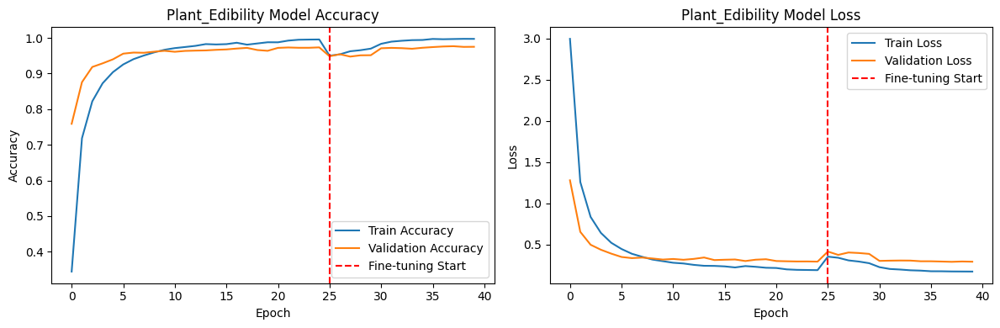

In [21]:
import matplotlib.pyplot as plt

# -----------------------------
# Plot All 5 Models Properly
# -----------------------------

for model_name, data in trained_models.items():

    history_stage1, history_stage2 = data["history"]

    # Combine Stage 1 + Stage 2
    acc = history_stage1.history['accuracy'] + history_stage2.history['accuracy']
    val_acc = history_stage1.history['val_accuracy'] + history_stage2.history['val_accuracy']
    loss = history_stage1.history['loss'] + history_stage2.history['loss']
    val_loss = history_stage1.history['val_loss'] + history_stage2.history['val_loss']

    plt.figure(figsize=(12, 4))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Train Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')

    # Mark Fine-tuning Start
    plt.axvline(x=len(history_stage1.history['accuracy']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    plt.title(f'{model_name} Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Train Loss')
    plt.plot(val_loss, label='Validation Loss')

    plt.axvline(x=len(history_stage1.history['loss']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    plt.title(f'{model_name} Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()



ROC Curve: Plant_Name


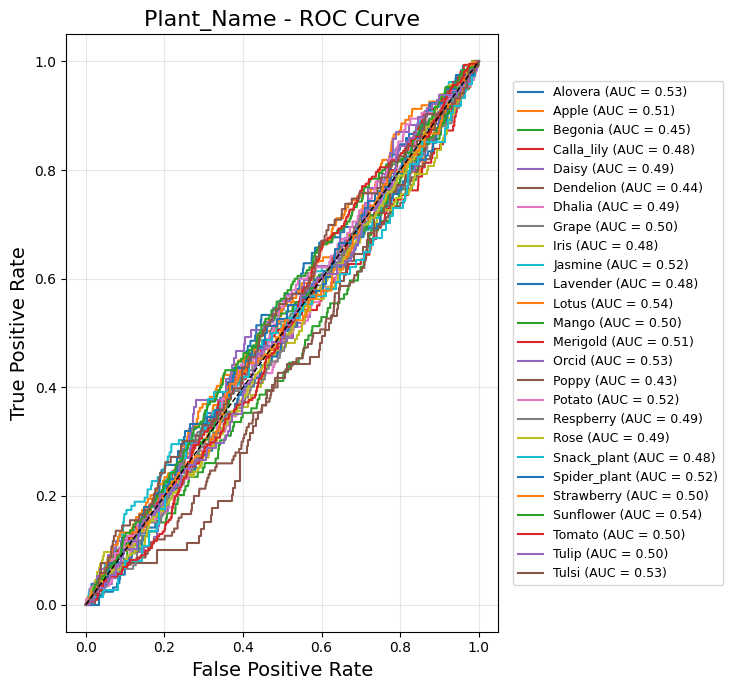


ROC Curve: Plant_Species


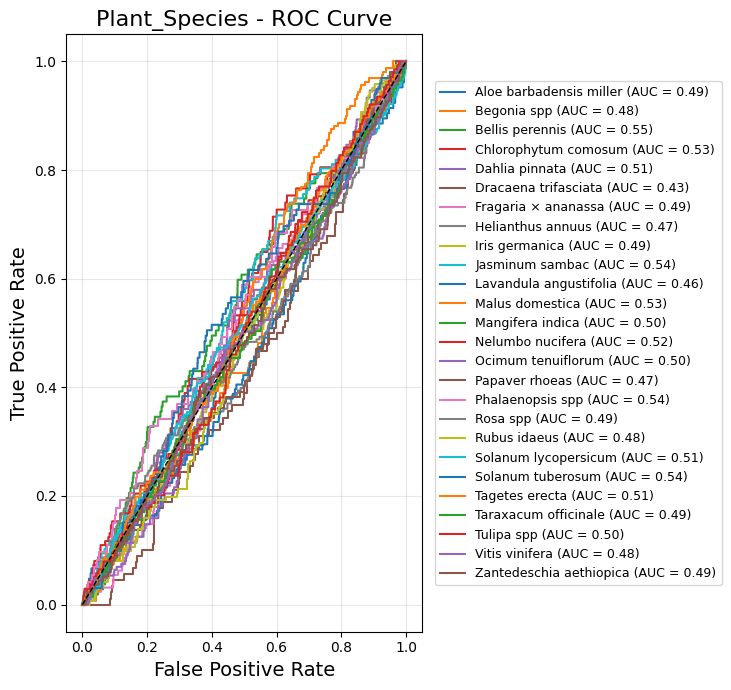


ROC Curve: Plant_Organ


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/tmp/ipython-input-3230919856.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.75, 1])  # leave space on the right for legend


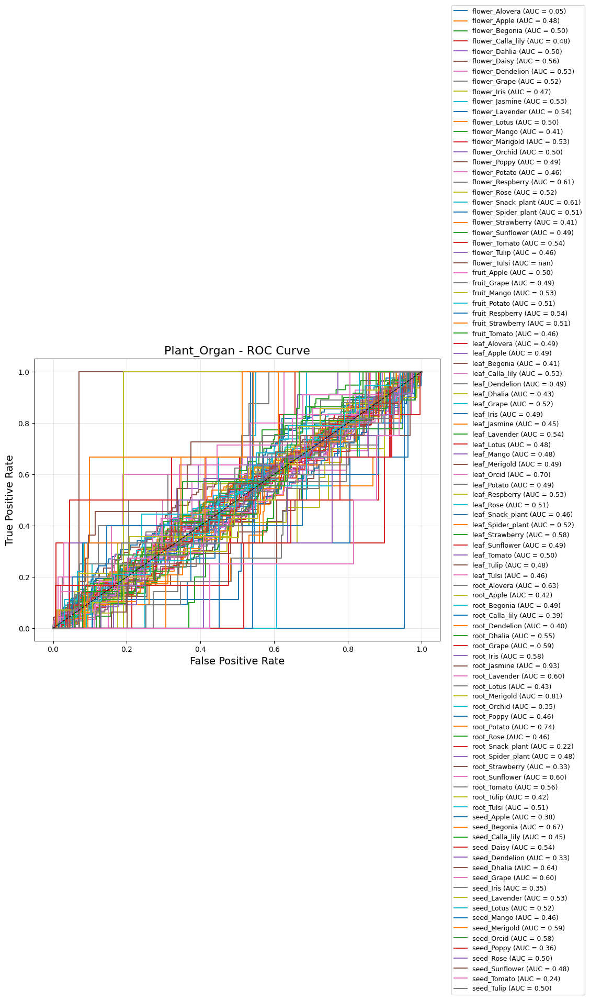


ROC Curve: Plant_Health


/tmp/ipython-input-3230919856.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.75, 1])  # leave space on the right for legend


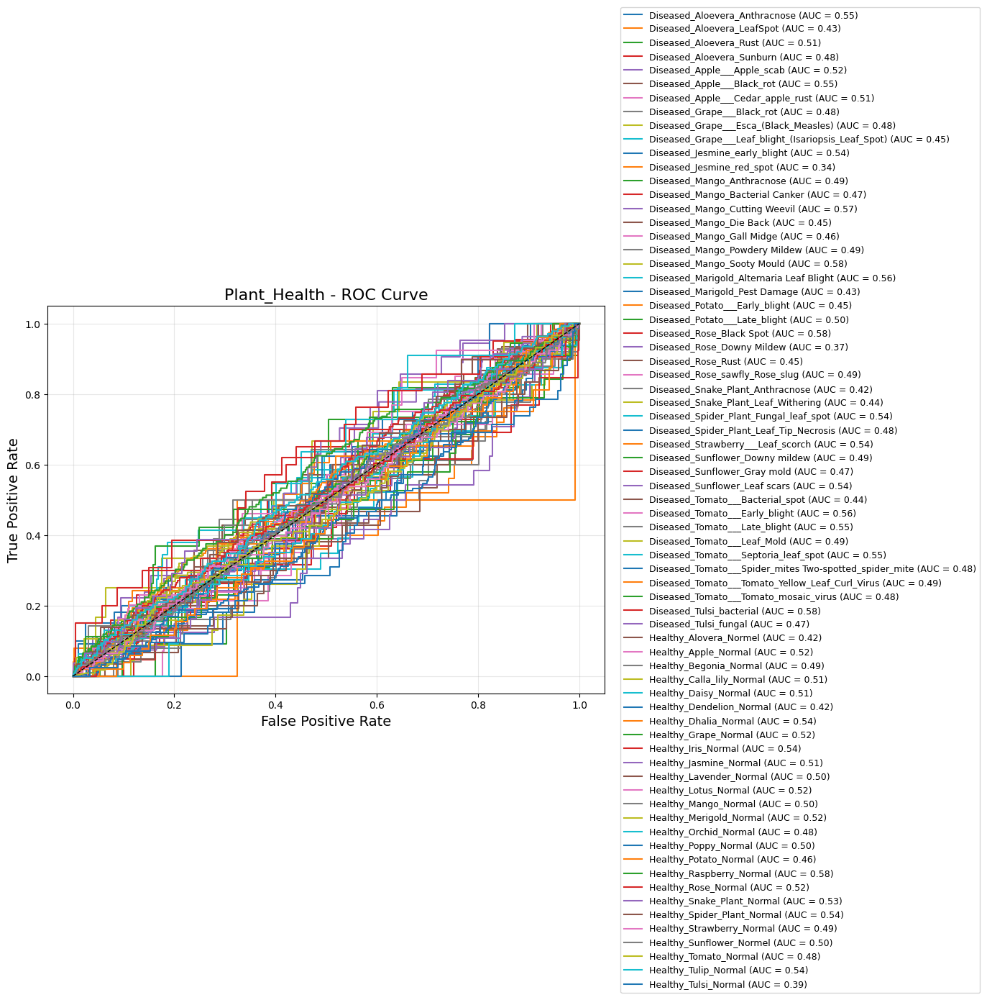


ROC Curve: Plant_Edibility


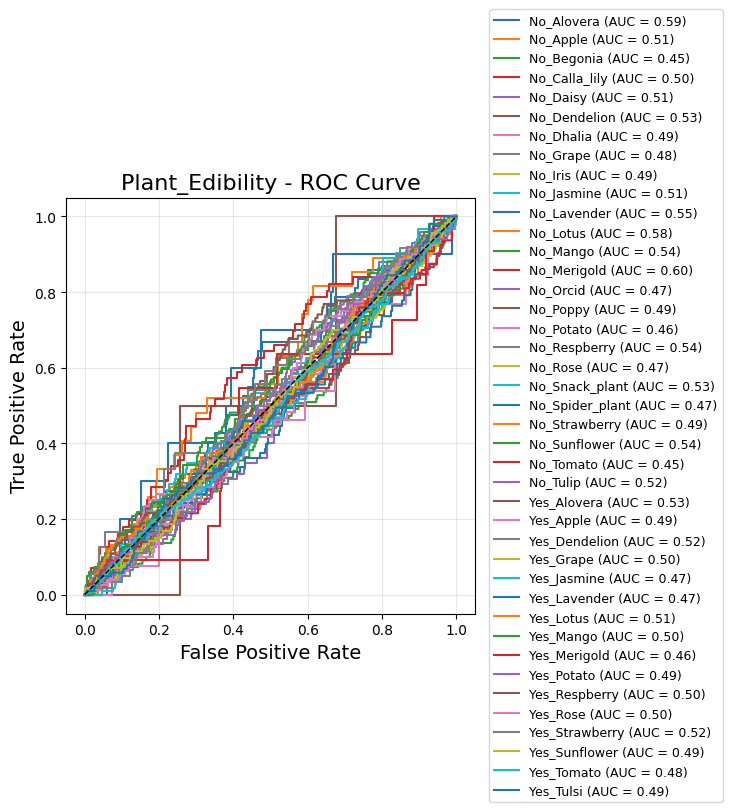

In [39]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import numpy as np

# -----------------------------
# Plot ROC curves for all models
# -----------------------------
for model_name in trained_models.keys():

    print("\n" + "="*60)
    print(f"ROC Curve: {model_name}")
    print("="*60)

    model = trained_models[model_name]["model"]
    val_ds = validation_datasets[model_name]
    class_names = class_name_lists[model_name]

    # Collect true labels
    y_true = []
    for images, labels in val_ds:
        y_true.extend(labels.numpy())
    y_true = np.array(y_true)

    # Predict probabilities
    y_pred_probs = model.predict(val_ds, verbose=0)

    n_classes = len(class_names)

    # Binarize labels for multi-class ROC
    y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))

    # Plot ROC per class
    plt.figure(figsize=(10, 7))  # wider figure
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

    # Diagonal line
    plt.plot([0, 1], [0, 1], 'k--', linewidth=1)

    plt.title(f"{model_name} - ROC Curve", fontsize=16)
    plt.xlabel("False Positive Rate", fontsize=14)
    plt.ylabel("True Positive Rate", fontsize=14)
    plt.grid(alpha=0.3)

    # Place legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), fontsize=9)
    plt.tight_layout(rect=[0, 0, 0.75, 1])  # leave space on the right for legend
    plt.show()


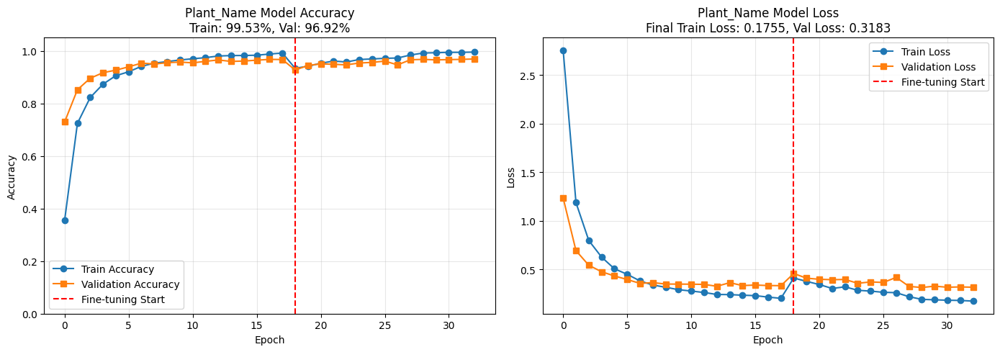

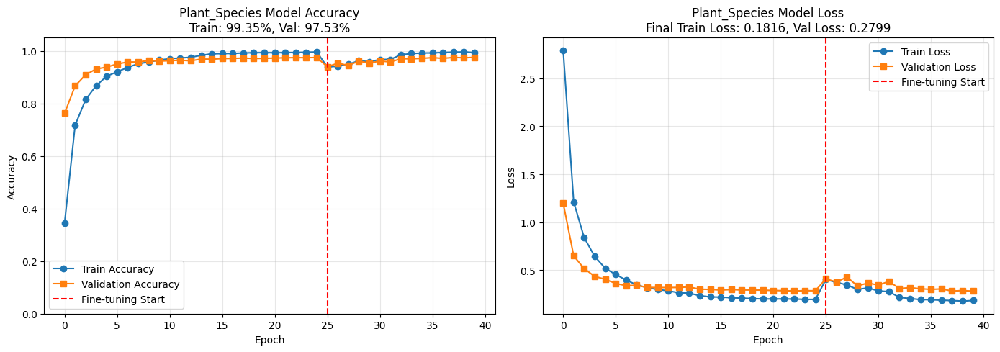

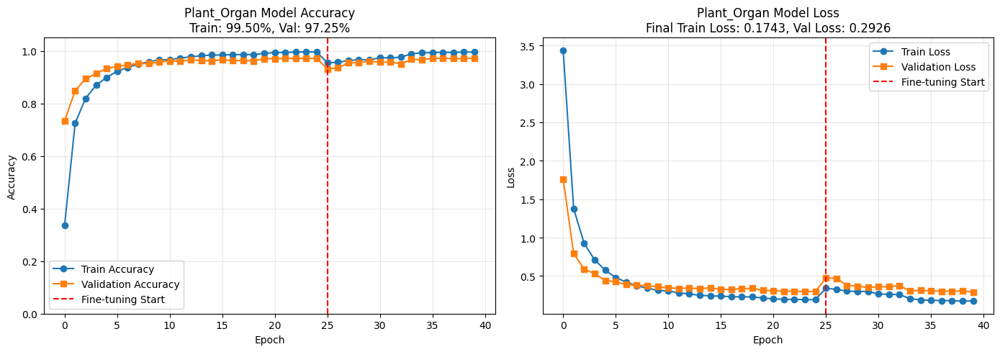

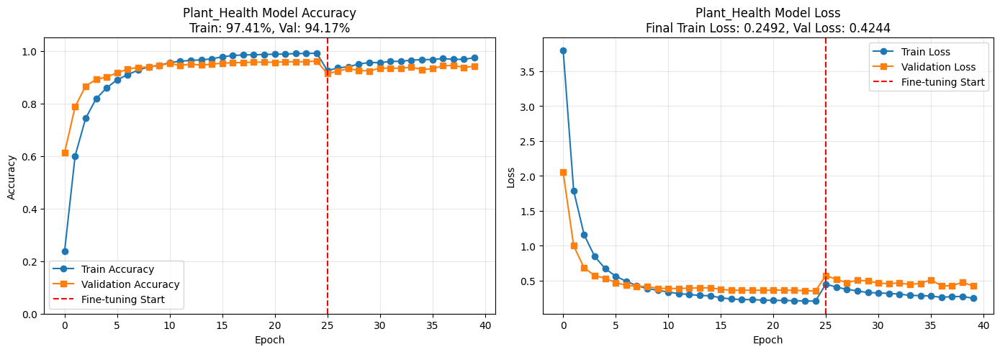

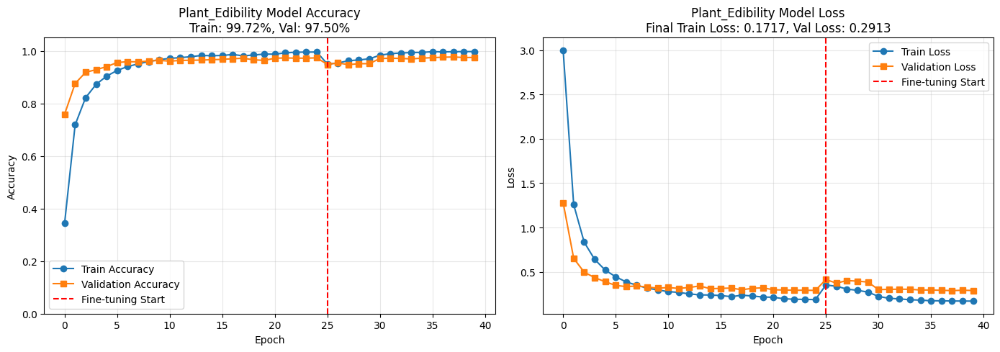

In [31]:
import matplotlib.pyplot as plt

# -----------------------------
# Plot All 5 Models Properly with Accuracy Numbers in Title
# -----------------------------
for model_name, data in trained_models.items():

    history_stage1, history_stage2 = data["history"]

    # Combine Stage 1 + Stage 2
    acc = history_stage1.history['accuracy'] + history_stage2.history['accuracy']
    val_acc = history_stage1.history['val_accuracy'] + history_stage2.history['val_accuracy']
    loss = history_stage1.history['loss'] + history_stage2.history['loss']
    val_loss = history_stage1.history['val_loss'] + history_stage2.history['val_loss']

    plt.figure(figsize=(14, 5))

    # ---- Accuracy Plot ----
    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Train Accuracy', marker='o')
    plt.plot(val_acc, label='Validation Accuracy', marker='s')

    # Mark Fine-tuning Start
    plt.axvline(x=len(history_stage1.history['accuracy']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    # Title with final accuracy numbers
    plt.title(f'{model_name} Model Accuracy\n'
              f'Train: {acc[-1]*100:.2f}%, Val: {val_acc[-1]*100:.2f}%', fontsize=12)

    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1.05)
    plt.legend()
    plt.grid(alpha=0.3)

    # ---- Loss Plot ----
    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Train Loss', marker='o')
    plt.plot(val_loss, label='Validation Loss', marker='s')

    plt.axvline(x=len(history_stage1.history['loss']),
                color='red', linestyle='--',
                label='Fine-tuning Start')

    plt.title(f'{model_name} Model Loss\n'
              f'Final Train Loss: {loss[-1]:.4f}, Val Loss: {val_loss[-1]:.4f}', fontsize=12)

    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()


In [34]:

# Prediction Function
def classify_image_5_models(img_path, trained_models, img_size=IMG_SIZE, confidence_threshold=CONFIDENCE_THRESHOLD):
    """
    Predict labels and confidence for all 5 plant models.
    Returns a dictionary with model_name -> (predicted_label, confidence)
    """

    # Class mapping for all 5 models
    class_mappings = {
        "Plant_Name": plant_names,
        "Plant_Species": plant_species,
        "Plant_Organ": plant_organs,
        "Plant_Health": plant_health,
        "Plant_Edibility": plant_edibility
    }

    # Check if image exists
    if not os.path.exists(img_path):
        return {model_name: ("Error: Image not found", 0.0) for model_name in class_mappings.keys()}

    # Load and preprocess image
    img = load_img(img_path, target_size=(img_size, img_size))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Dictionary to store predictions
    results = {}

    # Predict for each model
    for model_name, class_names in class_mappings.items():
        model = trained_models[model_name]["model"]

        pred_probs = model.predict(img_array, verbose=0)[0]
        conf = float(np.max(pred_probs))
        label = class_names[np.argmax(pred_probs)] if conf >= confidence_threshold else "Unknown"

        results[model_name] = (label, conf)

    return results




In [35]:
# Predict using the new 5-model function
predictions = classify_image_5_models('/content/plant_data/plant/Images/Plant Name/Rose/Downy Mildew  (100).jpg', trained_models)

# Print all results nicely
for model_name, (label, conf) in predictions.items():
    print(f"{model_name}: {label} ({conf:.2f})")


Plant_Name: Rose (1.00)
Plant_Species: Rosa spp (1.00)
Plant_Organ: leaf_Rose (1.00)
Plant_Health: Diseased_Rose_Downy Mildew (1.00)
Plant_Edibility: No_Rose (1.00)


--- Computing Summary Metrics for All Models ---
Evaluating Plant_Name...
Evaluating Plant_Species...
Evaluating Plant_Organ...
Evaluating Plant_Health...
Evaluating Plant_Edibility...

--- Model Performance Summary ---
             Model  Classes  Accuracy  Precision    Recall  F1-Score
0       Plant_Name       26  0.967565   0.967877  0.967565  0.967506
1    Plant_Species       26  0.975261   0.975608  0.975261  0.975169
2      Plant_Organ       98  0.972512   0.972806  0.972512  0.971213
3     Plant_Health       71  0.941726   0.946007  0.941726  0.941597
4  Plant_Edibility       41  0.976636   0.977289  0.976636  0.976607


/tmp/ipython-input-1239192921.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x="Model", y="Accuracy", data=df_metrics, palette="viridis", ax=ax1)


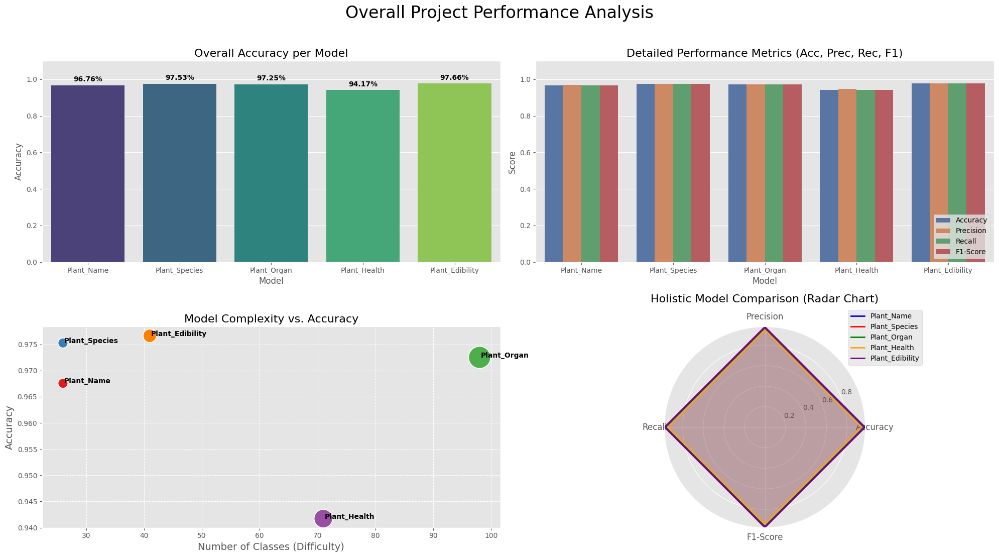

In [49]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from math import pi

# ==========================================
# 1. Compute Metrics for All Models
# ==========================================
print("--- Computing Summary Metrics for All Models ---")

model_metrics = []

# Ensure evaluation_datasets is defined (from your previous step)
if 'evaluation_datasets' not in locals():
    # Re-define if missing, assuming datasets exist in memory
    evaluation_datasets = {
        "Plant_Name": (val_plant_name_ds, plant_names),
        "Plant_Species": (val_plant_species_ds, plant_species),
        "Plant_Organ": (val_plant_organ_ds, plant_organs),
        "Plant_Health": (val_plant_health_ds, plant_health),
        "Plant_Edibility": (val_plant_edibility_ds, plant_edibility),
    }

for name, (val_ds, classes) in evaluation_datasets.items():
    print(f"Evaluating {name}...")
    model = trained_models[name]["model"]

    # Get True Labels and Predictions
    y_true = []
    y_pred_probs = []

    for x, y in val_ds:
        y_true.extend(y.numpy())
        y_pred_probs.extend(model.predict(x, verbose=0))

    y_true = np.array(y_true)
    y_pred = np.argmax(y_pred_probs, axis=1)

    # Calculate Metrics (Weighted for multi-class)
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)

    model_metrics.append({
        "Model": name,
        "Classes": len(classes),
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1-Score": f1
    })

# Convert to DataFrame
df_metrics = pd.DataFrame(model_metrics)
print("\n--- Model Performance Summary ---")
print(df_metrics)


# ==========================================
# 2. Plotting the Graphs
# ==========================================
plt.style.use('ggplot')
fig = plt.figure(figsize=(20, 12))
plt.suptitle("Overall Project Performance Analysis", fontsize=24, y=0.95)

# --- Plot 1: Accuracy Comparison (Simple Bar) ---
ax1 = plt.subplot(2, 2, 1)
bars = sns.barplot(x="Model", y="Accuracy", data=df_metrics, palette="viridis", ax=ax1)
ax1.set_title("Overall Accuracy per Model", fontsize=16)
ax1.set_ylim(0, 1.1)
for i, v in enumerate(df_metrics["Accuracy"]):
    ax1.text(i, v + 0.02, f"{v:.2%}", ha='center', fontweight='bold')

# --- Plot 2: Multi-Metric Comparison (Grouped Bar) ---
ax2 = plt.subplot(2, 2, 2)
df_melted = df_metrics.melt(id_vars=["Model", "Classes"], var_name="Metric", value_name="Score")
sns.barplot(x="Model", y="Score", hue="Metric", data=df_melted, palette="deep", ax=ax2)
ax2.set_title("Detailed Performance Metrics (Acc, Prec, Rec, F1)", fontsize=16)
ax2.set_ylim(0, 1.1)
ax2.legend(loc='lower right')

# --- Plot 3: Complexity vs. Performance (Scatter/Bubble) ---
ax3 = plt.subplot(2, 2, 3)
sns.scatterplot(x="Classes", y="Accuracy", size="Classes", sizes=(200, 1000),
                hue="Model", data=df_metrics, legend=False, palette="Set1", ax=ax3)
ax3.set_title("Model Complexity vs. Accuracy", fontsize=16)
ax3.set_xlabel("Number of Classes (Difficulty)", fontsize=14)
ax3.set_ylabel("Accuracy", fontsize=14)
# Add labels to points
for line in range(0, df_metrics.shape[0]):
    ax3.text(df_metrics.Classes[line]+0.2, df_metrics.Accuracy[line],
             df_metrics.Model[line], horizontalalignment='left', size='medium', color='black', weight='semibold')
ax3.grid(True, linestyle='--')

# --- Plot 4: Radar Chart (Spider Plot) ---
ax4 = plt.subplot(2, 2, 4, polar=True)

# Prepare Data for Radar Plot
labels = ["Accuracy", "Precision", "Recall", "F1-Score"]
num_vars = len(labels)
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += [angles[0]]  # Close the loop

# Draw the chart for each model
colors = ['b', 'r', 'g', 'orange', 'purple']
for i, row in df_metrics.iterrows():
    values = row[labels].values.flatten().tolist()
    values += [values[0]]  # Close the loop

    ax4.plot(angles, values, linewidth=2, linestyle='solid', label=row["Model"], color=colors[i])
    ax4.fill(angles, values, color=colors[i], alpha=0.1)

ax4.set_xticks(angles[:-1])
ax4.set_xticklabels(labels, fontsize=12)
ax4.set_title("Holistic Model Comparison (Radar Chart)", fontsize=16, y=1.1)
ax4.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

plt.tight_layout(rect=[0, 0.03, 1, 0.93])
plt.show()


Grad-CAM Explanations for Plant_Name
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Predicted Class: Sunflower (100.00%)


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_7']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


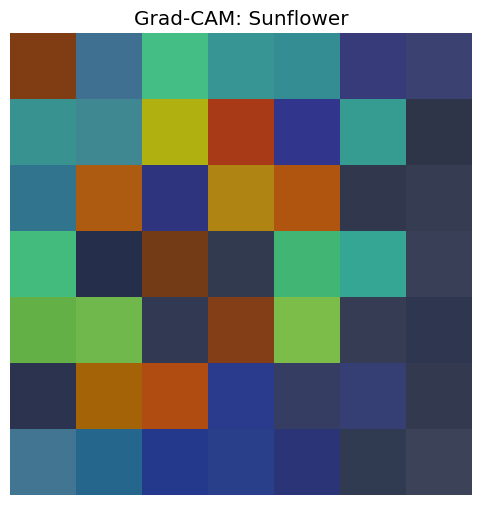

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Predicted Class: Dhalia (100.00%)


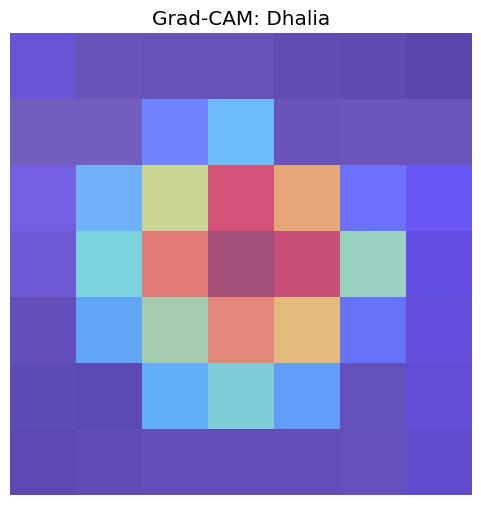

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Predicted Class: Rose (77.87%)


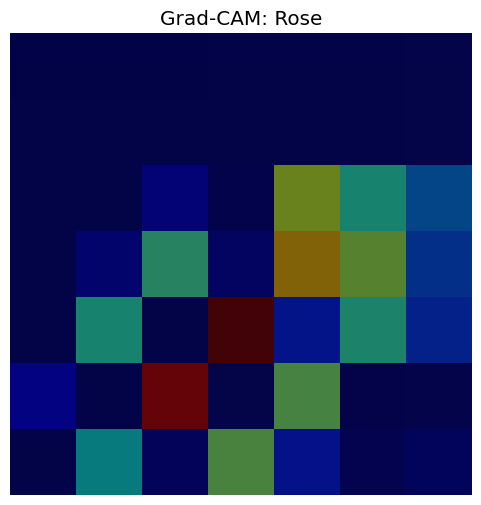


Grad-CAM Explanations for Plant_Species
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Predicted Class: Vitis vinifera (100.00%)


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_1043']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


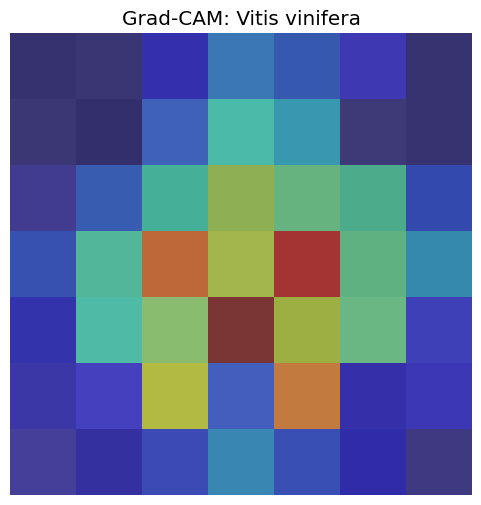

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Predicted Class: Ocimum tenuiflorum (100.00%)


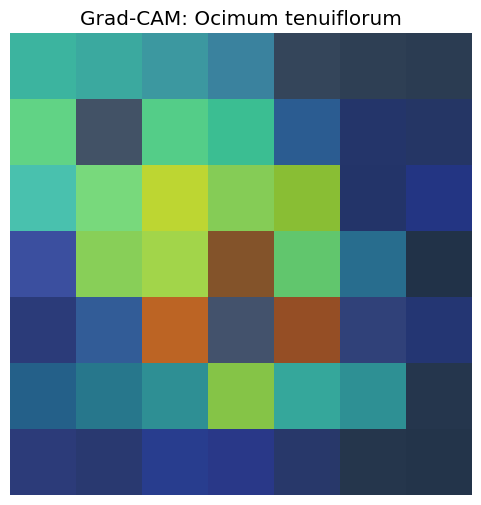

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Predicted Class: Helianthus annuus (100.00%)


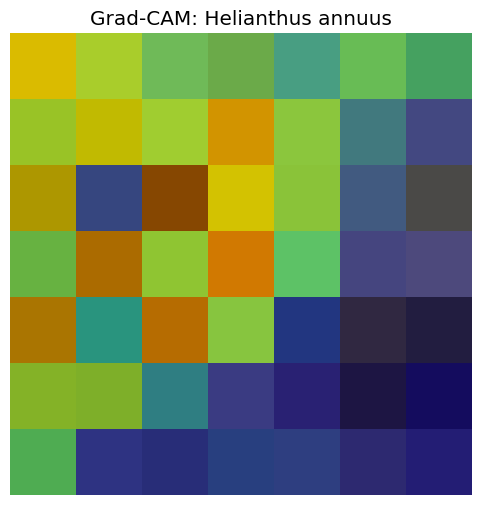


Grad-CAM Explanations for Plant_Organ
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
Predicted Class: root_Tulip (99.99%)


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_2079']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


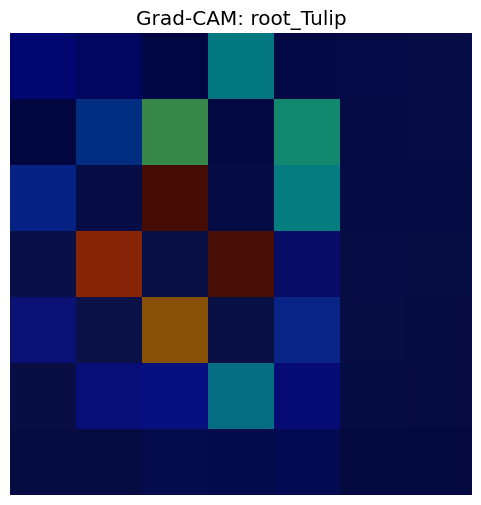

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Predicted Class: fruit_Tomato (100.00%)


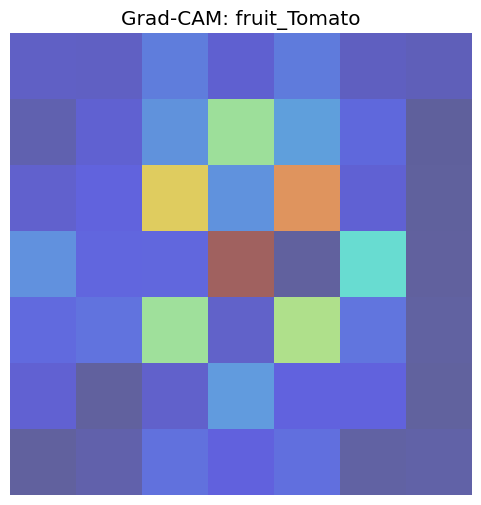

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Predicted Class: flower_Lotus (100.00%)


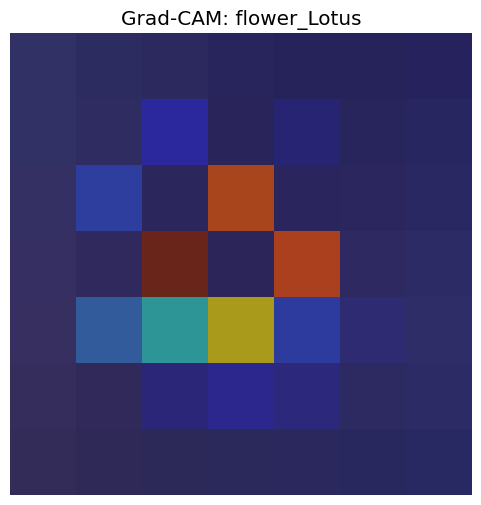


Grad-CAM Explanations for Plant_Health
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Predicted Class: Healthy_Tulip_Normal (100.00%)


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_3115']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


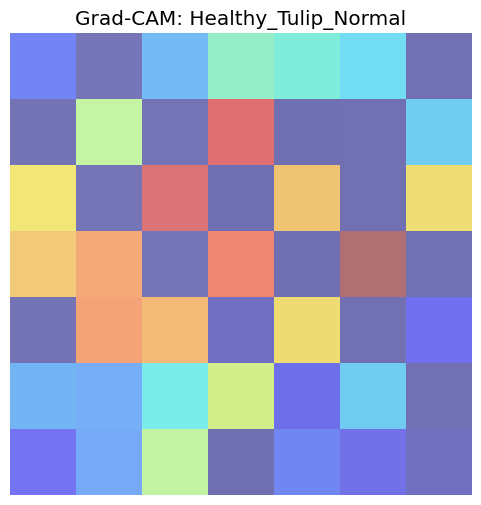

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Predicted Class: Healthy_Jasmine_Normal (100.00%)


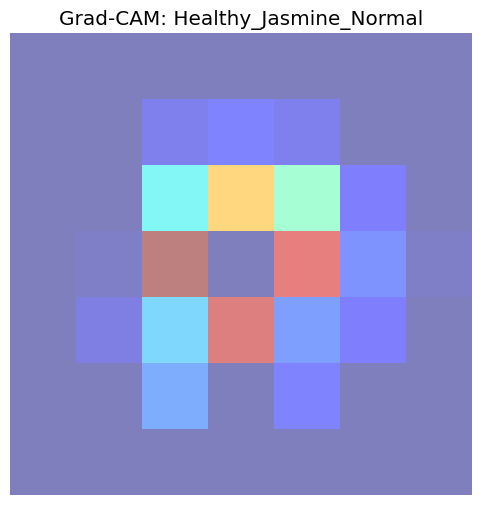

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Predicted Class: Diseased_Tulsi_bacterial (98.43%)


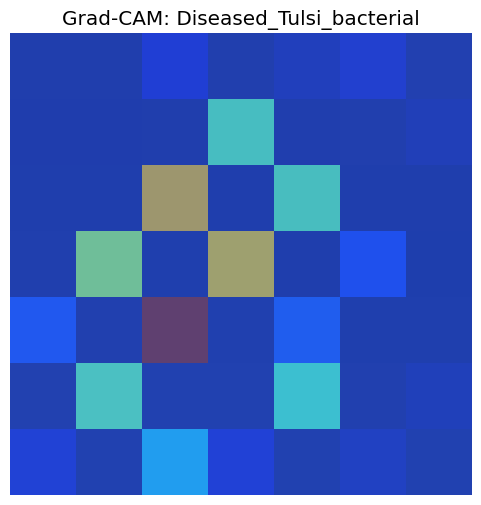


Grad-CAM Explanations for Plant_Edibility
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Predicted Class: Yes_Tomato (99.99%)


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_4151']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


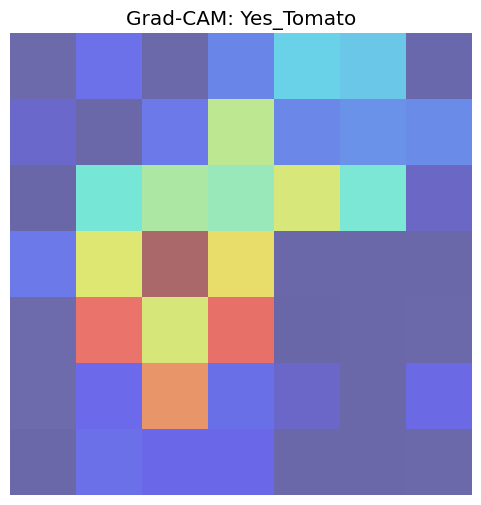

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Predicted Class: Yes_Alovera (100.00%)


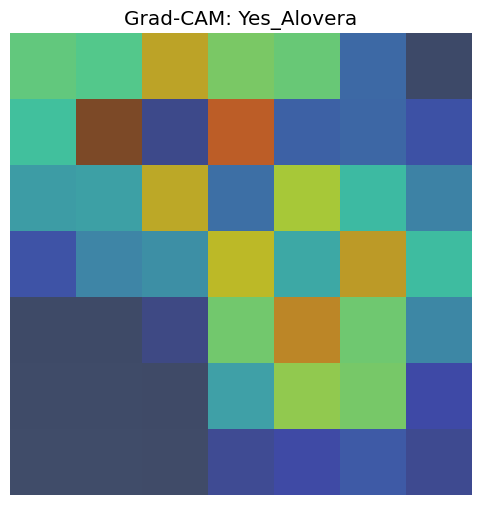

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Predicted Class: No_Iris (100.00%)


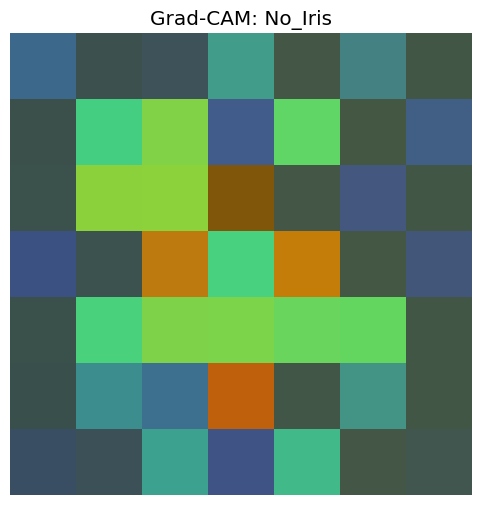

In [50]:


# -----------------------------
# Grad-CAM Helper Functions
# -----------------------------
def get_gradcam_heatmap(model, img_array, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()

def display_gradcam(model, img, class_names, last_conv_layer_name='top_conv'):
    img_array = np.expand_dims(img, axis=0).astype(np.float32)
    img_array = preprocess_input(img_array)

    preds = model.predict(img_array)
    pred_class = np.argmax(preds[0])
    pred_name = class_names[pred_class]
    print(f"Predicted Class: {pred_name} ({preds[0][pred_class]*100:.2f}%)")

    heatmap = get_gradcam_heatmap(model, img_array, last_conv_layer_name, pred_class)

    plt.figure(figsize=(6,6))
    plt.imshow(img.astype('uint8'))
    plt.imshow(heatmap, cmap='jet', alpha=0.5)
    plt.title(f"Grad-CAM: {pred_name}")
    plt.axis('off')
    plt.show()

# -----------------------------
# Apply Grad-CAM to All 5 Models
# -----------------------------
model_names = ['Plant_Name', 'Plant_Species', 'Plant_Organ', 'Plant_Health', 'Plant_Edibility']
validation_datasets = {
    "Plant_Name": val_plant_name_ds,
    "Plant_Species": val_plant_species_ds,
    "Plant_Organ": val_plant_organ_ds,
    "Plant_Health": val_plant_health_ds,
    "Plant_Edibility": val_plant_edibility_ds,
}
class_name_lists = {
    "Plant_Name": plant_names,
    "Plant_Species": plant_species,
    "Plant_Organ": plant_organs,
    "Plant_Health": plant_health,
    "Plant_Edibility": plant_edibility,
}

for model_name in model_names:
    print("\n" + "="*60)
    print(f"Grad-CAM Explanations for {model_name}")
    print("="*60)

    model = trained_models[model_name]['model']
    val_ds = validation_datasets[model_name]
    class_names = class_name_lists[model_name]

    # Take one batch of validation images
    for images, labels in val_ds.take(1):
        # Display Grad-CAM for the first 3 images
        for i in range(min(3, images.shape[0])):
            sample_img = images[i].numpy()
            display_gradcam(model, sample_img, class_names)
